In [36]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style("whitegrid")
imdb = pd.read_csv("./Content/movie_metadata.csv")
imdb.head()

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,...,3054.0,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,...,1238.0,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0
2,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000
4,NaN,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0


## Desafio 1 do [Thiago Gonçalves](https://twitter.com/tgcsantos)
### Plotar e analisar o Boxplot da média (coluna imbd_score) dos filmes em preto e branco e coloridos.

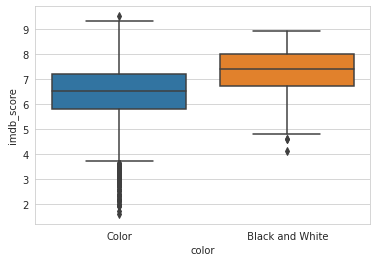

In [29]:
imdb_color_bw = imdb[["color", "imdb_score"]].dropna()
sns.boxplot(data=imdb_color_bw, x="color", y="imdb_score")

## Desafio 2 do [Guilherme Silveira](https://twitter.com/guilhermecaelum)
### No gráfico de **budget por lucro** temos um ponto com muito custo e prejuizo, descubra quem é esse filme (budget próximo de 2.5).

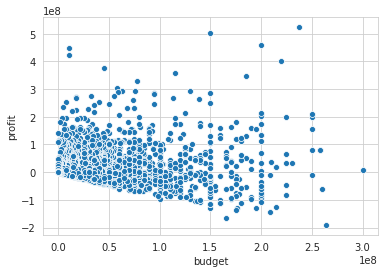

In [30]:
imdb_usa = imdb_clean_duplicates = imdb.query("country == 'USA'").drop_duplicates()

imdb_usa["profit"] = imdb_usa["gross"] - imdb_usa["budget"]

movies_budget_profit = imdb_usa[["budget", "profit", "movie_title"]].dropna().query("budget > 0 or profit > 0")

sns.scatterplot(data=movies_budget_profit, x="budget", y="profit")

In [31]:
movies_budget_profit.sort_values(by="budget", ascending=False).query("profit < 0")

,budget,profit,movie_title
5,263700000.0,-190641321.0,John Carter
7,260000000.0,-59192738.0,Tangled
18,250000000.0,-8936125.0,Pirates of the Caribbean: On Stranger Tides
16,225000000.0,-83385977.0,The Chronicles of Narnia: Prince Caspian
19,225000000.0,-45979146.0,Men in Black 3
...,...,...,...
4797,100000.0,-88202.0,Gory Gory Hallelujah
4979,70000.0,-39916.0,Happy Christmas
4978,60000.0,-19443.0,The FP
5009,27000.0,-18769.0,Pink Narcissus


## Desafio 3 do [Guilherme Silveira](https://twitter.com/guilhermecaelum)
### Em aula falamos que talvez, filmes mais recentes podem ter prejuizo pois ainda não tiveram tempo de recuperar o investimento. Analise essas informações e nos conte quais foram suas conclusões.

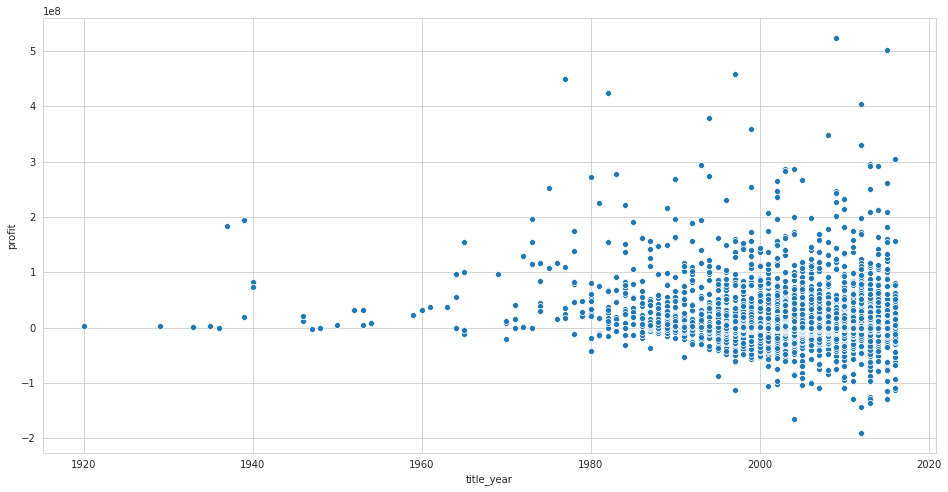

In [102]:
movies_profit_year = imdb_usa.query("budget > 0 or profit > 0")[["title_year", "profit"]].dropna()
plt.figure(figsize=(16,8))
sns.scatterplot(data=movies_profit_year, x="title_year", y="profit")

In [68]:
movies_profit_year["title_year"].max()

2016.0

In [215]:
profit_year = movies_profit_year.sort_values(["profit"], ascending=False).head(20)
profit_year.sort_values("title_year", ascending=False)

,title_year,profit
812,2016.0,305024263.0
29,2015.0,502177271.0
814,2014.0,291323553.0
521,2013.0,292049635.0
186,2013.0,294645577.0
439,2012.0,329999255.0
17,2012.0,403279547.0
0,2009.0,523505847.0
66,2008.0,348316061.0
582,2004.0,286471036.0


### temos dois filmes recentes entre os 20 filmes com maiores lucros

## Desafio 4 do [Paulo Silveira](https://twitter.com/paulo_caelum)
### Quais foram os filmes da decada pré 2° guerra que tiveram muito lucro.

In [225]:
imdb_usa.query("title_year < 1940").dropna().sort_values("profit", ascending=False)[["movie_title", "profit", "title_year"]]

,movie_title,profit,title_year
3970,Gone with the Wind,194678278.0,1939.0
4449,Snow White and the Seven Dwarfs,182925485.0,1937.0
4157,The Wizard of Oz,19402612.0,1939.0
4812,The Broadway Melody,2429000.0,1929.0
4706,Top Hat,2391000.0,1935.0
4786,42nd Street,1861000.0,1933.0
4427,Modern Times,-1336755.0,1936.0


### o filme "Gone with the Wind" foi lançado bem no inicio da Segunda Guerra Mundial

## Desafio 5 do [Paulo Silveira](https://twitter.com/paulo_caelum)
### No gráfico de **filmes_irmaos por dindin** temos alguns pontos estranhos entre 15 e 20. Confirme a tese genial do Paulo que o cidadão estranho é o Woody Allen. (Se ele tiver errado pode cornete nas redes sociais kkkkk)

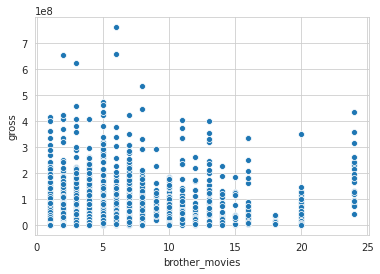

In [227]:
movies_director_name = imdb_usa["director_name"].value_counts()
movies_director_gross = imdb_usa[["director_name", "gross"]].set_index("director_name").join(movies_director_name, on="director_name")
movies_director_gross.columns=["gross", "brother_movies"]
movies_director_gross = movies_director_gross.reset_index()
sns.scatterplot(data=movies_director_gross, x="brother_movies", y="gross")

In [229]:
movies_director_gross.query("brother_movies > 16 and brother_movies < 20")

,director_name,gross,brother_movies
1538,Woody Allen,7496522.0,18.0
1737,Woody Allen,16684352.0,18.0
1861,Woody Allen,13383737.0,18.0
1869,Woody Allen,10569071.0,18.0
1872,Woody Allen,9714482.0,18.0
1960,Woody Allen,33404871.0,18.0
1975,Woody Allen,17071230.0,18.0
1993,Woody Allen,3203044.0,18.0
2070,Woody Allen,14792779.0,18.0
2078,Woody Allen,4839383.0,18.0


## Desafio 6 do [Thiago Gonçalves](https://twitter.com/tgcsantos)
### Analise mais detalhadamente o gráfico pairplot, gaste um tempo pensando e tentando enteder os gráficos.

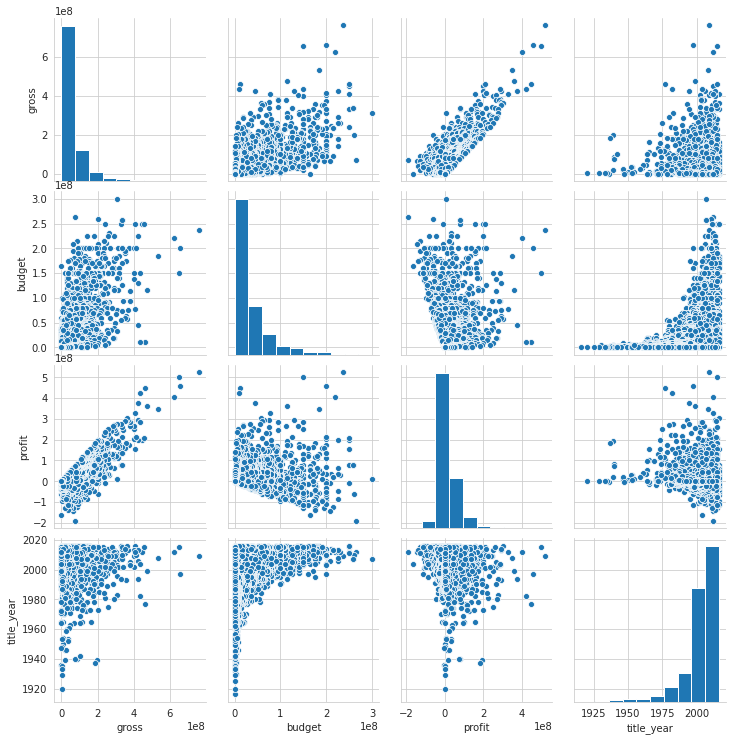

In [231]:
sns.pairplot(data = imdb_usa[["gross", "budget", "profit", "title_year"]])

In [237]:
imdb_usa[["gross", "budget"]].corr()

,gross,budget
gross,1.000000,0.645673
budget,0.645673,1.000000


### A uma pequena relação entre o lucro e o valor gasto na produção do filme, notável também que o número de filmes lançados a cada ano teve um aumento exponencial

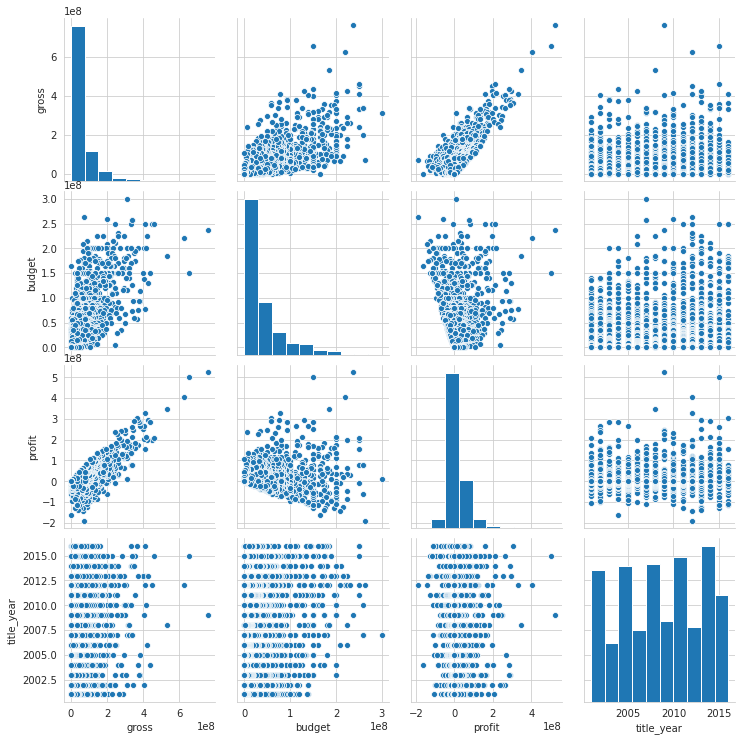

In [238]:
sns.pairplot(data = imdb_usa[["gross", "budget", "profit", "title_year"]].query("title_year > 2000"))

### não houve mudanças significativas do gráfico que possui filmes pré anos 2000

## Desafio 8 do [Allan Spadini](https://twitter.com/allanspadini)
### Tentar encontrar uma reta, pode ser com uma régua no monitor (não faça isso), com o excel/google sheets, com o python, no gráfico que parece se aproximar com uma reta (por exemplo budget/lucro, gross/lucro)

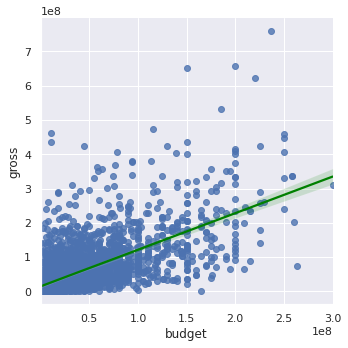

In [245]:
sns.lmplot(data = imdb_usa, x="budget", y="gross", line_kws={'color': 'green'})

## Desafio 9 da [Thais André](https://twitter.com/thais_tandre)
### Analisar e interpretar a correlação de outras variáveis além das feitas em sala (notas é uma boa). Número de avaliações por ano pode ser também uma feature.


In [246]:
imdb_usa

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,profit
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,...,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000,523505847.0
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,...,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0,9404152.0
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,...,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000,198130642.0
5,Color,Andrew Stanton,462.0,132.0,475.0,530.0,Samantha Morton,640.0,73058679.0,Action|Adventure|Sci-Fi,...,English,USA,PG-13,263700000.0,2012.0,632.0,6.6,2.35,24000,-190641321.0
6,Color,Sam Raimi,392.0,156.0,0.0,4000.0,James Franco,24000.0,336530303.0,Action|Adventure|Romance,...,English,USA,PG-13,258000000.0,2007.0,11000.0,6.2,2.35,0,78530303.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5037,Color,Edward Burns,14.0,95.0,0.0,133.0,Caitlin FitzGerald,296.0,4584.0,Comedy|Drama,...,English,USA,Not Rated,9000.0,2011.0,205.0,6.4,NaN,413,-4416.0
5039,Color,NaN,43.0,43.0,NaN,319.0,Valorie Curry,841.0,NaN,Crime|Drama|Mystery|Thriller,...,English,USA,TV-14,NaN,NaN,593.0,7.5,16.00,32000,NaN
5040,Color,Benjamin Roberds,13.0,76.0,0.0,0.0,Maxwell Moody,0.0,NaN,Drama|Horror|Thriller,...,English,USA,NaN,1400.0,2013.0,0.0,6.3,NaN,16,NaN
5041,Color,Daniel Hsia,14.0,100.0,0.0,489.0,Daniel Henney,946.0,10443.0,Comedy|Drama|Romance,...,English,USA,PG-13,NaN,2012.0,719.0,6.3,2.35,660,NaN


In [264]:
imdb_usa.query("title_year > 2010 and movie_facebook_likes > 0")[["movie_facebook_likes", "title_year"]].corr()

,movie_facebook_likes,title_year
movie_facebook_likes,1.000000,-0.007387
title_year,-0.007387,1.000000


In [273]:
facebook_votes_year = imdb_usa.query("title_year > 2010 and movie_facebook_likes > 0")[["movie_facebook_likes", "title_year", "movie_title"]].sort_values(by="movie_facebook_likes", ascending=False)
facebook_votes_year

,movie_facebook_likes,title_year,movie_title
96,349000,2014.0,Interstellar
296,199000,2012.0,Django Unchained
10,197000,2016.0,Batman v Superman: Dawn of Justice
179,190000,2015.0,The Revenant
99,166000,2012.0,The Hobbit: An Unexpected Journey
...,...,...,...
4777,9,2016.0,The Little Ponderosa Zoo
4716,9,2014.0,Light from the Darkroom
4372,8,2016.0,A Beginner's Guide to Snuff
4990,5,2015.0,Counting


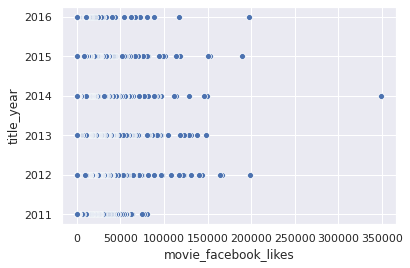

In [272]:
sns.scatterplot(data=facebook_votes_year, x="movie_facebook_likes", y="title_year")

In [274]:
imdb_usa.query("title_year > 2010 and movie_facebook_likes > 0")[["movie_facebook_likes", "profit"]].corr()

,movie_facebook_likes,profit
movie_facebook_likes,1.000000,0.372344
profit,0.372344,1.000000


In [286]:
imdb_usa.query("title_year > 2010 and director_facebook_likes > 0")[["profit", "director_facebook_likes"]].corr()

,profit,director_facebook_likes
profit,1.000000,0.089956
director_facebook_likes,0.089956,1.000000


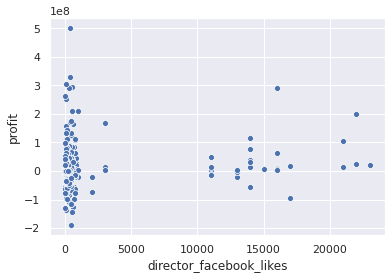

In [287]:
sns.scatterplot(data=imdb_usa.query("title_year > 2010 and director_facebook_likes > 0"), x="director_facebook_likes", y="profit")